In [25]:

import numpy as np
import os 
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib as mpl
#from netCDF4 import Dataset as NetCDFFile 
import cartopy.crs as ccrs
import matplotlib.colors as colors
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import mplotutils as mpu


### Functions for reading and plotting data

In [26]:
def data_read_3(variable, model,seas=''):  
    os.chdir(r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/'+model+'/') #location of data
    if model != 'ecearth':
        scenario = ['ctl','crop', 'frst', 'irr']# 'HARVST']
    else:
        scenario = ['ctl','crop', 'frst']# 'HARVST']
    lista = scenario
    for i in range(len(scenario)): 
        path = os.path.join( scenario[i]+ '/'+ variable + '_'+seas+'mean.nc')
        with xr.open_dataset(path, decode_times=False) as input:
            lon = input.lon
            lat = input.lat
            x = input[[variable]]
            lista[i] = x.to_array(variable)
            lista[i] = lista[i].squeeze('time')
            lista[i] = lista[i].squeeze([variable])

    if model != 'ecearth':
        lista1 = xr.concat([lista[0],lista[1],lista[2],lista[3]], pd.Index(["Control", "Deforestation", "Forestation", "Irrigation"], name = 'scenario'))
    else:
        lista1 = xr.concat([lista[0],lista[1],lista[2]], pd.Index(["Control", "Deforestation", "Forestation"], name = 'scenario'))

    return lista1


# Function for plotting results

def plot_facet(variable,title,level,num,color,col): #Define the function to calculate MFC in kg/m2/s
    variable.lon.attrs["long_name"] = "Lon"
    variable.lat.attrs["long_name"] = "Lat"
    variable.lon.attrs["units"] = "degrees"
    variable.lat.attrs["units"] = "degrees"

    if col == 'none':
        Facet = variable.plot(x="lon", y="lat", row = "scenario",
                              robust=True, cmap =color, cbar_kwargs={"label": title, 
                                                                     #"ticks": level, 
                                                                     'shrink' : 0.6, 
                                                                     'location': 'bottom'
                                                                     }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels= level#np.round(np.arange(-20,22,2),decimals = 0)
                              )                                                        
    else:
         Facet = variable.plot(x="lon", y="lat", col="Variable", row = "scenario",
                              robust=True, cmap =color, cbar_kwargs={"label": title,
                                                                     #"ticks": level,
                                                                     'shrink' : 0.6, 
                                                                     'location': 'bottom'
                                                                     }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = level #np.round(np.arange(np.nanmin(Precipitation),np.nanmax(Precipitation),(np.nanmax(Precipitation)-np.nanmin(Precipitation))/20), decimals = 1)
                              #levels = np.round(np.arange(npuantile(Precipitation, 0.20),np.quantile(Precipitation, 0.95),(np.quantile(Precipitation, 0.95)-np.quantile(Precipitation, 0.20))/20), decimals = 0)
                              #levels= np.round(np.arange(-20,22,2),decimals = 0)
                              )
         
    for ax in Facet.axes.flat:
        ax.coastlines()
        #ax.gridlines()
        ax.set_xticks([-100, -50, 0, 50, 100])
        ax.set_yticks([-50, 0, 50])
        #Fig.axes.quiver(xax, yax, U_crops.isel(lev = 31).values, V_crops.isel(lev = 31).values)
    
        #Facet.axes.streamplot(xax, yax, U_crops.isel(lev = 31).values, V_crops.isel(lev = 31).values, transform=ccrs.PlateCarree(central_longitude=0.0, globe=None), color= V_crops.isel(lev = 31).values, cmap='Greens_r', linewidth=lw)

    
    if num == 3:
        TemporaryNumpyArray = Facet.axes[0]
        for ax in TemporaryNumpyArray.flat:
            ax.set_title("")
            ax.set_title("", fontsize = 10, loc ='left')
        TemporaryNumpyArray = Facet.axes[1]
        #for ax in TemporaryNumpyArray.flat:
         #   ax.set_title("Evapotranspiration")
          #  ax.set_title("b)", fontsize = 10, loc ='left')
        #TemporaryNumpyArray = Facet.axes[2]
        #for ax in TemporaryNumpyArray.flat:
         # ax.set_title("Irrigation expansion")
          #ax.set_title("c)", fontsize = 10, loc ='left')
          
            
    else:
        TemporaryNumpyArray = Facet.axes[0]
        for ax in TemporaryNumpyArray.flat:
            ax.set_title("Control")
            ax.set_title("a)", fontsize = 10, loc ='left')
        TemporaryNumpyArray = Facet.axes[1]
        for ax in TemporaryNumpyArray.flat:
            ax.set_title("Crop world")
            ax.set_title("b)", fontsize = 10, loc ='left')
        TemporaryNumpyArray = Facet.axes[2]
        for ax in TemporaryNumpyArray.flat:
           ax.set_title("Forest world")
           ax.set_title("c)", fontsize = 10, loc ='left')
        TemporaryNumpyArray = Facet.axes[3]
        for ax in TemporaryNumpyArray.flat:
            ax.set_title("Irrigated crop world")  
            ax.set_title("d)", fontsize = 10, loc ='left')
            
    #os.chdir(r'C:\Users\Beheerder\thesis')       
    #name = title[0:3]+'_'+title[4:7] + '.png'
    
    #plt.savefig(name, dpi=400)
            

### Read in P, E and MFC data and compute values

In [27]:
plt.rcParams['figure.figsize'] = [20, 10]

l_vapo = 2450000 #Latent heat of vaporization (J/kg)
latnrs = np.arange(0,192) # minimal domain 
lonnrs = np.arange(0,288)
g = 9.80665 # [m/s2] from ERA-interim archive
density_water = 1000 # [kg/m3]
#lsm_data_CESM = 'landmask_cesm.nc' # insert landseamask here
#area_mask = 'gridarea.nc'

E = data_read_3('LHFLX', 'cesm')/(l_vapo*1000)*1000*3600*24 #Evapotranspiration in mm/day
PRECT = (data_read_3('PRECT', 'cesm'))*1000*3600*24 #Precipitation in mm/day
E_djf = data_read_3('LHFLX', 'cesm',seas='DJF')/(l_vapo*1000)*1000*3600*24 #Evapotranspiration in mm/day
PRECT_djf = (data_read_3('PRECT', 'cesm',seas='DJF'))*1000*3600*24 #Precipitation in mm/day
E_jja = data_read_3('LHFLX', 'cesm',seas='JJA')/(l_vapo*1000)*1000*3600*24 #Evapotranspiration in mm/day
PRECT_jja = (data_read_3('PRECT', 'cesm',seas='JJA'))*1000*3600*24 #Precipitation in mm/day

MFC=data_read_3('MFC','cesm')
MFC_djf=data_read_3('MFC','cesm',seas='DJF')
MFC_jja=data_read_3('MFC','cesm',seas='JJA')


E_ec = data_read_3('hfls', 'ecearth')/(l_vapo*1000)*1000*3600*24 #Evapotranspiration in mm/day
PRECT_ec = (data_read_3('pr', 'ecearth'))*3600*24 #Precipitation in mm/day
E_ec_djf = data_read_3('hfls', 'ecearth',seas='DJF')/(l_vapo*1000)*1000*3600*24 #Evapotranspiration in mm/day
PRECT_ec_djf = (data_read_3('pr', 'ecearth',seas='JJA'))*3600*24 #Precipitation in mm/day
E_ec_jja = data_read_3('hfls', 'ecearth',seas='DJF')/(l_vapo*1000)*1000*3600*24 #Evapotranspiration in mm/day
PRECT_ec_jja = (data_read_3('pr', 'ecearth',seas='JJA'))*3600*24 #Precipitation in mm/day

MFC_ec=data_read_3('MFC','ecearth')
MFC_ec_djf=data_read_3('MFC','ecearth',seas='DJF')
MFC_ec_jja=data_read_3('MFC','ecearth',seas='JJA')


E_mpi = data_read_3('hfls', 'mpiesm')/(l_vapo*1000)*1000*3600*24 #Evapotranspiration in mm/day
PRECT_mpi = (data_read_3('pr', 'mpiesm'))*3600*24 #Precipitation in mm/day
E_mpi_djf = data_read_3('hfls', 'mpiesm',seas='DJF')/(l_vapo*1000)*1000*3600*24 #Evapotranspiration in mm/day
PRECT_mpi_djf = (data_read_3('pr', 'mpiesm',seas='DJF'))*3600*24 #Precipitation in mm/day
E_mpi_jja = data_read_3('hfls', 'mpiesm',seas='JJA')/(l_vapo*1000)*1000*3600*24 #Evapotranspiration in mm/day
PRECT_mpi_jja = (data_read_3('pr', 'mpiesm',seas='JJA'))*3600*24 #Precipitation in mm/day

MFC_mpi=data_read_3('MFC','mpiesm')
MFC_mpi_djf=data_read_3('MFC','mpiesm',seas='DJF')
MFC_mpi_jja=data_read_3('MFC','mpiesm',seas='JJA')



In [28]:
###############################################################################
#####  Changens in P AND E COMPARISON AMONG LULM   ####################################
############################################################################### 
PT_def = (PRECT[1] - PRECT[0])*365#Deforestation 
PT_def = PT_def.reset_coords(names='time', drop=True)
PT_for = (PRECT[2] - PRECT[0])*365 #Afforestation 
PT_irr = (PRECT[3] - PRECT[1])*365#Irrigation expansion 

PT_def_djf = (PRECT_djf[1] - PRECT_djf[0])*365#Deforestation 
PT_for_djf = (PRECT_djf[2] - PRECT_djf[0])*365 #Afforestation 
PT_irr_djf = (PRECT_djf[3] - PRECT_djf[1])*365#Irrigation expansion 

PT_def_jja = (PRECT_jja[1] - PRECT_jja[0])*365#Deforestation 
PT_for_jja = (PRECT_jja[2] - PRECT_jja[0])*365 #Afforestation 
PT_irr_jja = (PRECT_jja[3] - PRECT_jja[1])*365#Irrigation expansion 

PT_def_rel = (PRECT[1] - PRECT[0])/PRECT[0]*100#Deforestation 
PT_def_rel = PT_def_rel.reset_coords(names='time', drop=True)
PT_for_rel = (PRECT[2] - PRECT[0])/PRECT[0]*100 #Afforestation 
PT_irr_rel = (PRECT[3] - PRECT[1])/PRECT[0]*100#Irrigation expansion 

PT_def_rel_djf = (PRECT_djf[1] - PRECT_djf[0])/PRECT_djf[0]*100#Deforestation 
PT_for_rel_djf = (PRECT_djf[2] - PRECT_djf[0])/PRECT_djf[0]*100 #Afforestation 
PT_irr_rel_djf = (PRECT_djf[3] - PRECT_djf[1])/PRECT_djf[0]*100#Irrigation expansion 

PT_def_rel_jja = (PRECT_jja[1] - PRECT_jja[0])/PRECT_jja[0]*100#Deforestation 
PT_for_rel_jja = (PRECT_jja[2] - PRECT_jja[0])/PRECT_jja[0]*100 #Afforestation 
PT_irr_rel_jja = (PRECT_jja[3] - PRECT_jja[1])/PRECT_jja[0]*100#Irrigation expansion 

PT_def_ec = (PRECT_ec[1] - PRECT_ec[0])*365#Deforestation 
PT_for_ec = (PRECT_ec[2] - PRECT_ec[0])*365 #Afforestation 

PT_def_ec_djf = (PRECT_ec_djf[1] - PRECT_ec_djf[0])*365#Deforestation 
PT_for_ec_djf = (PRECT_ec_djf[2] - PRECT_ec_djf[0])*365 #Afforestation 

PT_def_ec_jja = (PRECT_ec_jja[1] - PRECT_ec_jja[0])*365#Deforestation 
PT_for_ec_jja = (PRECT_ec_jja[2] - PRECT_ec_jja[0])*365 #Afforestation 

PT_def_ec_rel = (PRECT_ec[1] - PRECT_ec[0])/PRECT_ec[0]*100#Deforestation 
PT_for_ec_rel = (PRECT_ec[2] - PRECT_ec[0])/PRECT_ec[0]*100 #Afforestation 

PT_def_ec_rel_djf = (PRECT_ec_djf[1] - PRECT_ec_djf[0])/PRECT_ec_djf[0]*100#Deforestation 
PT_for_ec_rel_djf = (PRECT_ec_djf[2] - PRECT_ec_djf[0])/PRECT_ec_djf[0]*100 #Afforestation 

PT_def_ec_rel_jja = (PRECT_ec_jja[1] - PRECT_ec_jja[0])/PRECT_ec_jja[0]*100#Deforestation 
PT_for_ec_rel_jja = (PRECT_ec_jja[2] - PRECT_ec_jja[0])/PRECT_ec_jja[0]*100 #Afforestation 

PT_def_mpi = (PRECT_mpi[1] - PRECT_mpi[0])*365#Deforestation 
PT_for_mpi = (PRECT_mpi[2] - PRECT_mpi[0])*365 #Afforestation 
PT_irr_mpi = (PRECT_mpi[3] - PRECT_mpi[1])*365#Irrigation expansion 

PT_def_mpi_djf = (PRECT_mpi_djf[1] - PRECT_mpi_djf[0])*365#Deforestation 
PT_for_mpi_djf = (PRECT_mpi_djf[2] - PRECT_mpi_djf[0])*365 #Afforestation 
PT_irr_mpi_djf = (PRECT_mpi_djf[3] - PRECT_mpi_djf[1])*365#Irrigation expansion 

PT_def_mpi_jja = (PRECT_mpi_jja[1] - PRECT_mpi_jja[0])*365#Deforestation 
PT_for_mpi_jja = (PRECT_mpi_jja[2] - PRECT_mpi_jja[0])*365 #Afforestation 
PT_irr_mpi_jja = (PRECT_mpi_jja[3] - PRECT_mpi_jja[1])*365#Irrigation expansion 

PT_def_mpi_rel = (PRECT_mpi[1] - PRECT_mpi[0])/PRECT_mpi[0]*100#Deforestation 
PT_for_mpi_rel = (PRECT_mpi[2] - PRECT_mpi[0])/PRECT_mpi[0]*100 #Afforestation 
PT_irr_mpi_rel = (PRECT_mpi[3] - PRECT_mpi[1])/PRECT_mpi[0]*100#Irrigation expansion 

PT_def_mpi_rel_djf = (PRECT_mpi_djf[1] - PRECT_mpi_djf[0])/PRECT_mpi_djf[0]*100#Deforestation 
PT_for_mpi_rel_djf = (PRECT_mpi_djf[2] - PRECT_mpi_djf[0])/PRECT_mpi_djf[0]*100 #Afforestation 
PT_irr_mpi_rel_djf = (PRECT_mpi_djf[3] - PRECT_mpi_djf[1])/PRECT_mpi_djf[0]*100#Irrigation expansion 

PT_def_mpi_rel_jja = (PRECT_mpi_jja[1] - PRECT_mpi_jja[0])/PRECT_mpi_jja[0]*100#Deforestation 
PT_for_mpi_rel_jja = (PRECT_mpi_jja[2] - PRECT_mpi_jja[0])/PRECT_mpi_jja[0]*100 #Afforestation 
PT_irr_mpi_rel_jja = (PRECT_mpi_jja[3] - PRECT_mpi_jja[1])/PRECT_mpi_jja[0]*100#Irrigation expansion 

In [29]:
###############################################################################
#####  Changens in P AND E COMPARISON AMONG LULM   ####################################
############################################################################### 
E_def = (E[1] - E[0])*365#Deforestation 
E_def = E_def.reset_coords(names='time', drop=True)
E_for = (E[2] - E[0])*365 #Afforestation 
E_irr = (E[3] - E[1])*365#Irrigation expansion 

E_def_djf = (E_djf[1] - E_djf[0])*365#Deforestation 
E_for_djf = (E_djf[2] - E_djf[0])*365 #Afforestation 
E_irr_djf = (E_djf[3] - E_djf[1])*365#Irrigation expansion 

E_def_jja = (E_jja[1] - E_jja[0])*365#Deforestation 
E_for_jja = (E_jja[2] - E_jja[0])*365 #Afforestation 
E_irr_jja = (E_jja[3] - E_jja[1])*365#Irrigation expansion 

E_def_rel = (E[1] - E[0])/E[0]*100#Deforestation 
E_def_rel = E_def_rel.reset_coords(names='time', drop=True)
E_for_rel = (E[2] - E[0])/E[0]*100 #Afforestation 
E_irr_rel = (E[3] - E[1])/E[0]*100#Irrigation expansion 

E_def_rel_djf = (E_djf[1] - E_djf[0])/E_djf[0]*100#Deforestation 
E_for_rel_djf = (E_djf[2] - E_djf[0])/E_djf[0]*100 #Afforestation 
E_irr_rel_djf = (E_djf[3] - E_djf[1])/E_djf[0]*100#Irrigation expansion 

E_def_rel_jja = (E_jja[1] - E_jja[0])/E_jja[0]*100#Deforestation 
E_for_rel_jja = (E_jja[2] - E_jja[0])/E_jja[0]*100 #Afforestation 
E_irr_rel_jja = (E_jja[3] - E_jja[1])/E_jja[0]*100#Irrigation expansion 

E_def_ec = (E_ec[1] - E_ec[0])*365#Deforestation 
E_for_ec = (E_ec[2] - E_ec[0])*365 #Afforestation 

E_def_ec_djf = (E_ec_djf[1] - E_ec_djf[0])*365#Deforestation 
E_for_ec_djf = (E_ec_djf[2] - E_ec_djf[0])*365 #Afforestation 

E_def_ec_jja = (E_ec_jja[1] - E_ec_jja[0])*365#Deforestation 
E_for_ec_jja = (E_ec_jja[2] - E_ec_jja[0])*365 #Afforestation 

E_def_ec_rel = (E_ec[1] - E_ec[0])/E_ec[0]*100#Deforestation 
E_for_ec_rel = (E_ec[2] - E_ec[0])/E_ec[0]*100 #Afforestation 

E_def_ec_rel_djf = (E_ec_djf[1] - E_ec_djf[0])/E_ec_djf[0]*100#Deforestation 
E_for_ec_rel_djf = (E_ec_djf[2] - E_ec_djf[0])/E_ec_djf[0]*100 #Afforestation 

E_def_ec_rel_jja = (E_ec_jja[1] - E_ec_jja[0])/E_ec_jja[0]*100#Deforestation 
E_for_ec_rel_jja = (E_ec_jja[2] - E_ec_jja[0])/E_ec_jja[0]*100 #Afforestation 

E_def_mpi = (E_mpi[1] - E_mpi[0])*365#Deforestation 
E_for_mpi = (E_mpi[2] - E_mpi[0])*365 #Afforestation 
E_irr_mpi = (E_mpi[3] - E_mpi[1])*365#Irrigation expansion 

E_def_mpi_djf = (E_mpi_djf[1] - E_mpi_djf[0])*365#Deforestation 
E_for_mpi_djf = (E_mpi_djf[2] - E_mpi_djf[0])*365 #Afforestation 
E_irr_mpi_djf = (E_mpi_djf[3] - E_mpi_djf[1])*365#Irrigation expansion 

E_def_mpi_jja = (E_mpi_jja[1] - E_mpi_jja[0])*365#Deforestation 
E_for_mpi_jja = (E_mpi_jja[2] - E_mpi_jja[0])*365 #Afforestation 
E_irr_mpi_jja = (E_mpi_jja[3] - E_mpi_jja[1])*365#Irrigation expansion 

E_def_mpi_rel = (E_mpi[1] - E_mpi[0])/E_mpi[0]*100#Deforestation 
E_for_mpi_rel = (E_mpi[2] - E_mpi[0])/E_mpi[0]*100 #Afforestation 
E_irr_mpi_rel = (E_mpi[3] - E_mpi[1])/E_mpi[0]*100#Irrigation expansion 

E_def_mpi_rel_djf = (E_mpi_djf[1] - E_mpi_djf[0])/E_mpi_djf[0]*100#Deforestation 
E_for_mpi_rel_djf = (E_mpi_djf[2] - E_mpi_djf[0])/E_mpi_djf[0]*100 #Afforestation 
E_irr_mpi_rel_djf = (E_mpi_djf[3] - E_mpi_djf[1])/E_mpi_djf[0]*100#Irrigation expansion 

E_def_mpi_rel_jja = (E_mpi_jja[1] - E_mpi_jja[0])/E_mpi_jja[0]*100#Deforestation 
E_for_mpi_rel_jja = (E_mpi_jja[2] - E_mpi_jja[0])/E_mpi_jja[0]*100 #Afforestation 
E_irr_mpi_rel_jja = (E_mpi_jja[3] - E_mpi_jja[1])/E_mpi_jja[0]*100#Irrigation expansion


In [30]:
###############################################################################
#####  Changens in P AND E COMPARISON AMONG LULM   ####################################
############################################################################### 
MFC_def = (MFC[1] - MFC[0])#Deforestation 
MFC_for = (MFC[2] - MFC[0]) #Afforestation 
MFC_irr = (MFC[3] - MFC[1])#Irrigation expansion 

MFC_def_djf = (MFC_djf[1] - MFC_djf[0])#Deforestation 
MFC_for_djf = (MFC_djf[2] - MFC_djf[0]) #Afforestation 
MFC_irr_djf = (MFC_djf[3] - MFC_djf[1])#Irrigation expansion 

MFC_def_jja = (MFC_jja[1] - MFC_jja[0])#Deforestation 
MFC_for_jja = (MFC_jja[2] - MFC_jja[0]) #Afforestation 
MFC_irr_jja = (MFC_jja[3] - MFC_jja[1])#Irrigation expansion 

MFC_def_rel = (MFC[1] - MFC[0])/MFC[0]*100#Deforestation 
MFC_for_rel = (MFC[2] - MFC[0])/MFC[0]*100 #Afforestation 
MFC_irr_rel = (MFC[3] - MFC[1])/MFC[0]*100#Irrigation expansion 

MFC_def_rel_djf = (MFC_djf[1] - MFC_djf[0])/MFC_djf[0]*100#Deforestation 
MFC_for_rel_djf = (MFC_djf[2] - MFC_djf[0])/MFC_djf[0]*100 #Afforestation 
MFC_irr_rel_djf = (MFC_djf[3] - MFC_djf[1])/MFC_djf[0]*100#Irrigation expansion 

MFC_def_rel_jja = (MFC_jja[1] - MFC_jja[0])/MFC_jja[0]*100#Deforestation 
MFC_for_rel_jja = (MFC_jja[2] - MFC_jja[0])/MFC_jja[0]*100 #Afforestation 
MFC_irr_rel_jja = (MFC_jja[3] - MFC_jja[1])/MFC_jja[0]*100#Irrigation expansion 

MFC_def_ec = (MFC_ec[1] - MFC_ec[0])#Deforestation 
MFC_for_ec = (MFC_ec[2] - MFC_ec[0]) #Afforestation 

MFC_def_ec_djf = (MFC_ec_djf[1] - MFC_ec_djf[0])#Deforestation 
MFC_for_ec_djf = (MFC_ec_djf[2] - MFC_ec_djf[0]) #Afforestation 

MFC_def_ec_jja = (MFC_ec_jja[1] - MFC_ec_jja[0])#Deforestation 
MFC_for_ec_jja = (MFC_ec_jja[2] - MFC_ec_jja[0])#Afforestation 

MFC_def_ec_rel = (MFC_ec[1] - MFC_ec[0])/MFC_ec[0]*100#Deforestation 
MFC_for_ec_rel = (MFC_ec[2] - MFC_ec[0])/MFC_ec[0]*100 #Afforestation 

MFC_def_ec_rel_djf = (MFC_ec_djf[1] - MFC_ec_djf[0])/MFC_ec_djf[0]*100#Deforestation 
MFC_for_ec_rel_djf = (MFC_ec_djf[2] - MFC_ec_djf[0])/MFC_ec_djf[0]*100 #Afforestation 

MFC_def_ec_rel_jja = (MFC_ec_jja[1] - MFC_ec_jja[0])/MFC_ec_jja[0]*100#Deforestation 
MFC_for_ec_rel_jja = (MFC_ec_jja[2] - MFC_ec_jja[0])/MFC_ec_jja[0]*100 #Afforestation 

MFC_def_mpi = (MFC_mpi[1] - MFC_mpi[0])#Deforestation 
MFC_for_mpi = (MFC_mpi[2] - MFC_mpi[0]) #Afforestation 
MFC_irr_mpi = (MFC_mpi[3] - MFC_mpi[1])#Irrigation expansion 

MFC_def_mpi_djf = (MFC_mpi_djf[1] - MFC_mpi_djf[0])#Deforestation 
MFC_for_mpi_djf = (MFC_mpi_djf[2] - MFC_mpi_djf[0]) #Afforestation 
MFC_irr_mpi_djf = (MFC_mpi_djf[3] - MFC_mpi_djf[1])#Irrigation expansion 

MFC_def_mpi_jja = (MFC_mpi_jja[1] - MFC_mpi_jja[0])#Deforestation 
MFC_for_mpi_jja = (MFC_mpi_jja[2] - MFC_mpi_jja[0]) #Afforestation 
MFC_irr_mpi_jja = (MFC_mpi_jja[3] - MFC_mpi_jja[1])#Irrigation expansion 

MFC_def_mpi_rel = (MFC_mpi[1] - MFC_mpi[0])/MFC_mpi[0]*100#Deforestation 
MFC_for_mpi_rel = (MFC_mpi[2] - MFC_mpi[0])/MFC_mpi[0]*100 #Afforestation 
MFC_irr_mpi_rel = (MFC_mpi[3] - MFC_mpi[1])/MFC_mpi[0]*100#Irrigation expansion 

MFC_def_mpi_rel_djf = (MFC_mpi_djf[1] - MFC_mpi_djf[0])/MFC_mpi_djf[0]*100#Deforestation 
MFC_for_mpi_rel_djf = (MFC_mpi_djf[2] - MFC_mpi_djf[0])/MFC_mpi_djf[0]*100 #Afforestation 
MFC_irr_mpi_rel_djf = (MFC_mpi_djf[3] - MFC_mpi_djf[1])/MFC_mpi_djf[0]*100#Irrigation expansion 

MFC_def_mpi_rel_jja = (MFC_mpi_jja[1] - MFC_mpi_jja[0])/MFC_mpi_jja[0]*100#Deforestation 
MFC_for_mpi_rel_jja = (MFC_mpi_jja[2] - MFC_mpi_jja[0])/MFC_mpi_jja[0]*100 #Afforestation 
MFC_irr_mpi_rel_jja = (MFC_mpi_jja[3] - MFC_mpi_jja[1])/MFC_mpi_jja[0]*100#Irrigation expansion


### plot mean precipitation (%)

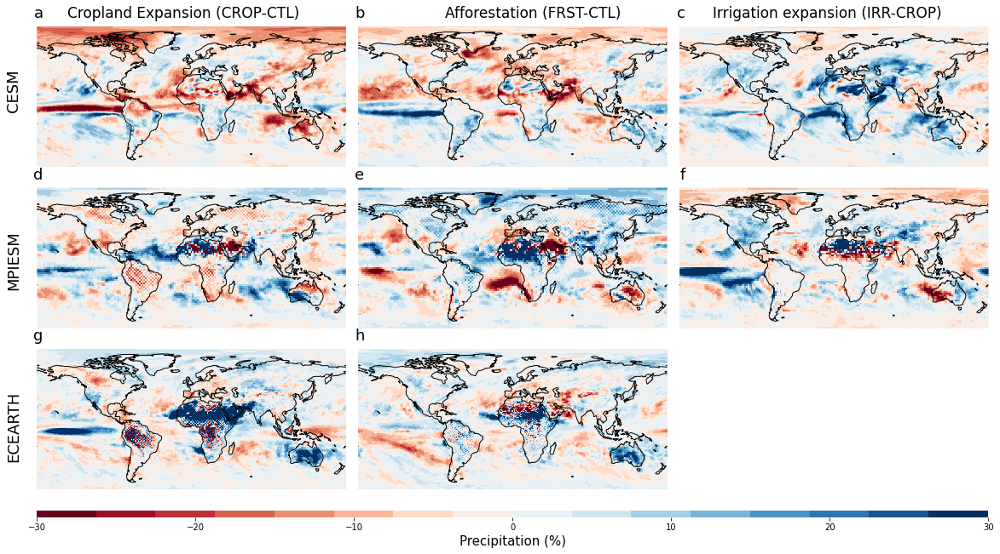

In [7]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[PT_def_rel,PT_for_rel,PT_irr_rel]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[PT_def_ec_rel,PT_for_ec_rel]
        pan_list=['g','h']
    elif model=='mpiesm':
        da_list=[PT_def_mpi_rel,PT_for_mpi_rel,PT_irr_mpi_rel]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-30, 30]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = '%'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='Precipitation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



### plot summer precipitation (%)

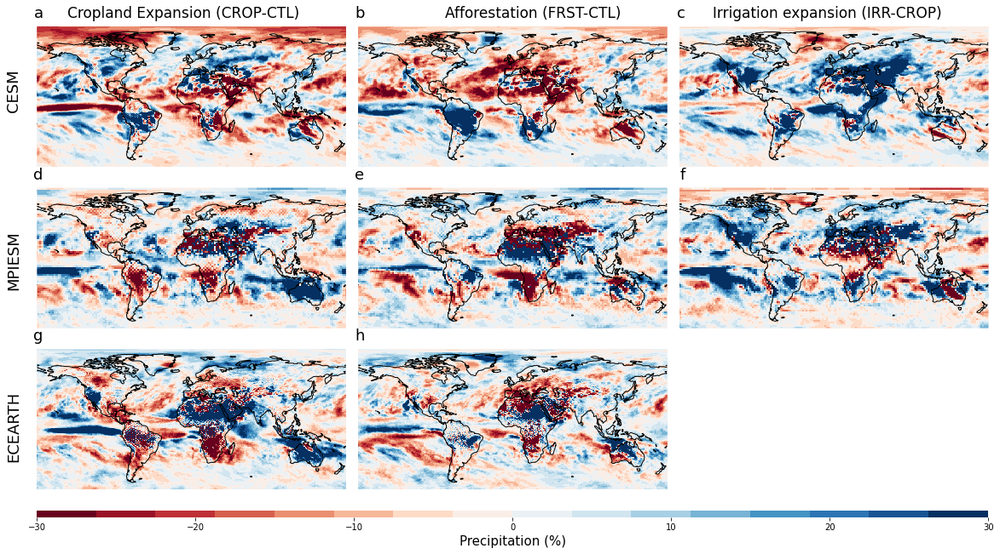

In [8]:
plt.rcParams['figure.figsize'] = [20, 10]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[PT_def_rel_jja,PT_for_rel_jja,PT_irr_rel_jja]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[PT_def_ec_rel_jja,PT_for_ec_rel_jja]
        pan_list=['g','h']
    elif model=='mpiesm':
        da_list=[PT_def_mpi_rel_jja,PT_for_mpi_rel_jja,PT_irr_mpi_rel_jja]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-30, 30]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = '%'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='Precipitation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



### plot winter precipitation (%)


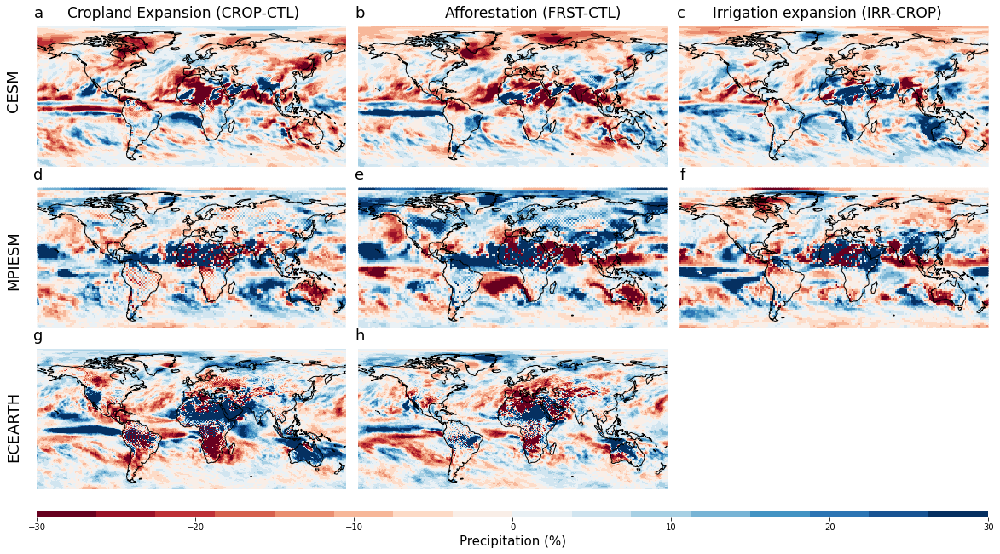

In [9]:
plt.rcParams['figure.figsize'] = [20, 10]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[PT_def_rel_djf,PT_for_rel_djf,PT_irr_rel_djf]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[PT_def_ec_rel_djf,PT_for_ec_rel_djf]
        pan_list=['g','h']
    elif model=='mpiesm':
        da_list=[PT_def_mpi_rel_djf,PT_for_mpi_rel_djf,PT_irr_mpi_rel_djf]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-30, 30]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = '%'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='Precipitation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



### plot mean Evaporation (%)

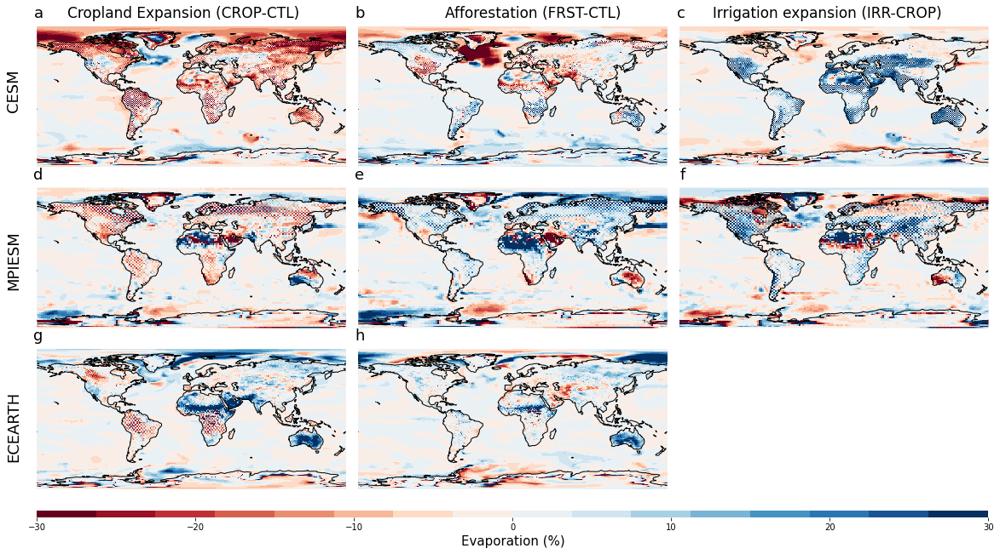

In [10]:
plt.rcParams['figure.figsize'] = [20, 10]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[E_def_rel,E_for_rel,E_irr_rel]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[E_def_ec_rel,E_for_ec_rel]
        pan_list=['g','h']
    elif model=='mpiesm':
        da_list=[E_def_mpi_rel,E_for_mpi_rel,E_irr_mpi_rel]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-30, 30]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = '%'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='Evaporation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)




### plot summer evaporation (%)


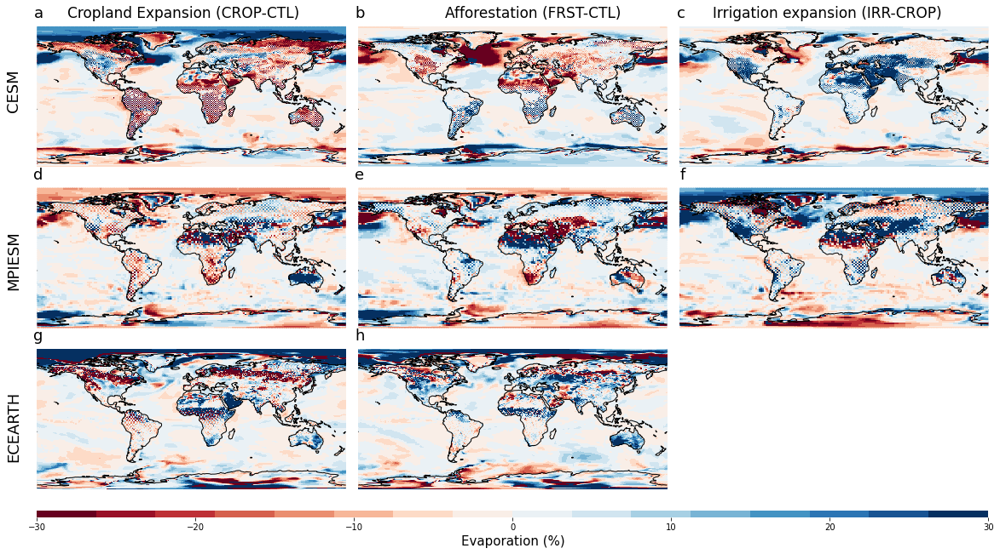

In [11]:
plt.rcParams['figure.figsize'] = [20, 10]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[E_def_rel_jja,E_for_rel_jja,E_irr_rel_jja]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[E_def_ec_rel_jja,E_for_ec_rel_jja]
        pan_list=['g','h']
    elif model=='mpiesm':
        da_list=[E_def_mpi_rel_jja,E_for_mpi_rel_jja,E_irr_mpi_rel_jja]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-30, 30]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = '%'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='Evaporation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)




### plot Winter evaporation (%)


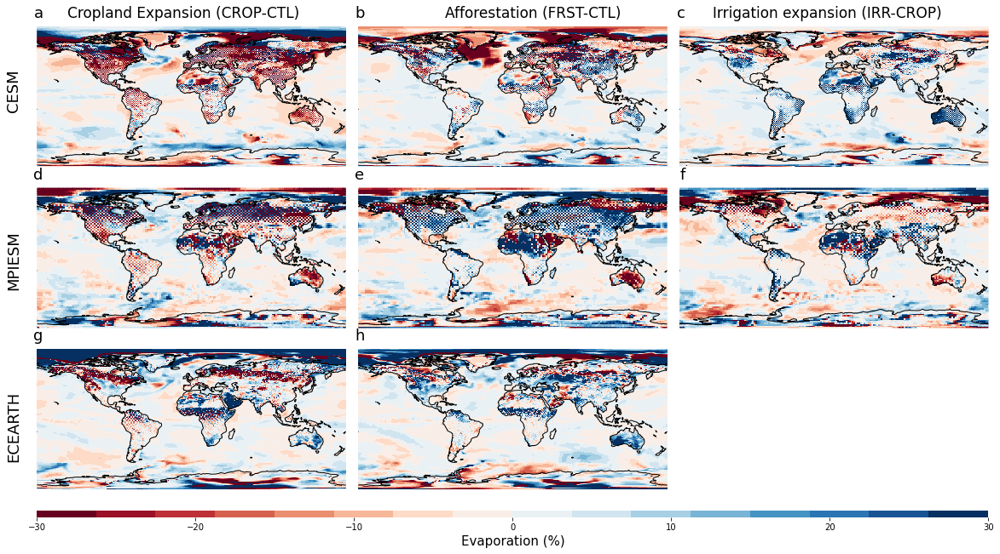

In [12]:
plt.rcParams['figure.figsize'] = [20, 10]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[E_def_rel_djf,E_for_rel_djf,E_irr_rel_djf]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[E_def_ec_rel_djf,E_for_ec_rel_djf]
        pan_list=['g','h']
    elif model=='mpiesm':
        da_list=[E_def_mpi_rel_djf,E_for_mpi_rel_djf,E_irr_mpi_rel_djf]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-30, 30]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = '%'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='Evaporation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)




### plot mean evaporation (mm/day)

In [7]:
if np.max([np.max(E_def/365),np.max(E_for/365),np.max(E_irr/365),np.max(E_def_mpi/365),np.max(E_for_mpi/365),np.max(E_irr_mpi/365),np.max(E_def_ec/365)]) > 0.6:
    extend='max'
    if np.min([np.min(E_def/365),np.min(E_for/365),np.min(E_irr/365),np.min(E_def_mpi/365),np.min(E_for_mpi/365),np.min(E_irr_mpi/365),np.min(E_def_ec/365)]) < -0.6:
        extend='both'
elif np.min([np.min(E_def/365),np.min(E_for/365),np.min(E_irr/365),np.min(E_def_mpi/365),np.min(E_for_mpi/365),np.min(E_irr_mpi/365),np.min(E_def_ec/365)]) < -0.6:
    extend='min'
else:
    extend='neither'
print(extend)

both


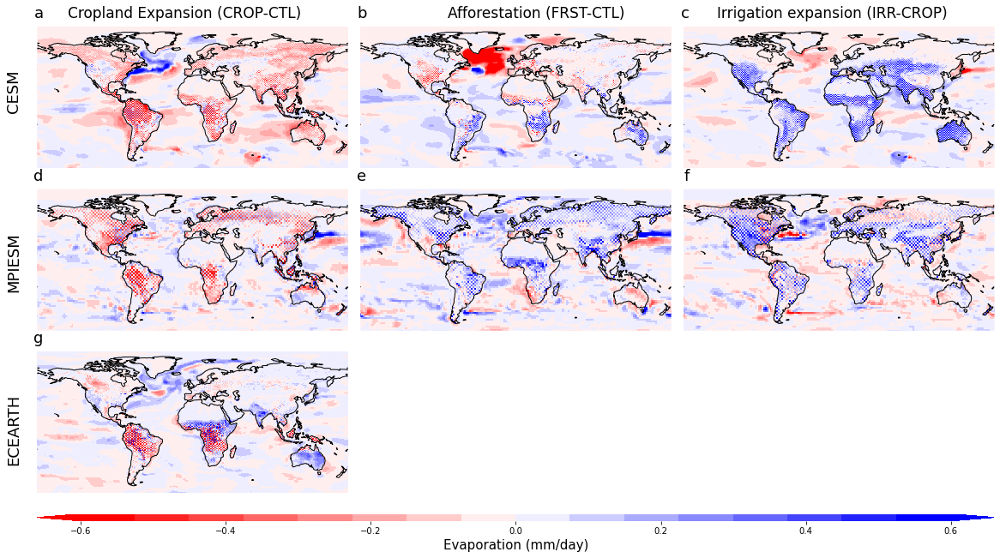

In [9]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='bwr_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[E_def/365,E_for/365,E_irr/365]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[E_def_ec/365]
        pan_list=['g']
    elif model=='mpiesm':
        da_list=[E_def_mpi/365,E_for_mpi/365,E_irr_mpi/365]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-0.6, 0.6]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal',extend=extend)
cbar.set_label(label='Evaporation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



### plot summer evaporation (mm/day)

In [12]:
if np.max([np.max(E_def_jja/365),np.max(E_for_jja/365),np.max(E_irr_jja/365),np.max(E_def_mpi_jja/365),np.max(E_for_mpi_jja/365),np.max(E_irr_mpi_jja/365),np.max(E_def_ec_jja/365)]) > 0.6:
    extend='max'
    if np.min([np.min(E_def_jja/365),np.min(E_for_jja/365),np.min(E_irr_jja/365),np.min(E_def_mpi_jja/365),np.min(E_for_mpi_jja/365),np.min(E_irr_mpi_jja/365),np.min(E_def_ec_jja/365)]) < -0.6:
        extend='both'
elif np.min([np.min(E_def_jja/365),np.min(E_for_jja/365),np.min(E_irr_jja/365),np.min(E_def_mpi_jja/365),np.min(E_for_mpi_jja/365),np.min(E_irr_mpi_jja/365),np.min(E_def_ec_jja/365)]) < -0.6:
    extend='min'
else:
    extend='neither'
print(extend)

both


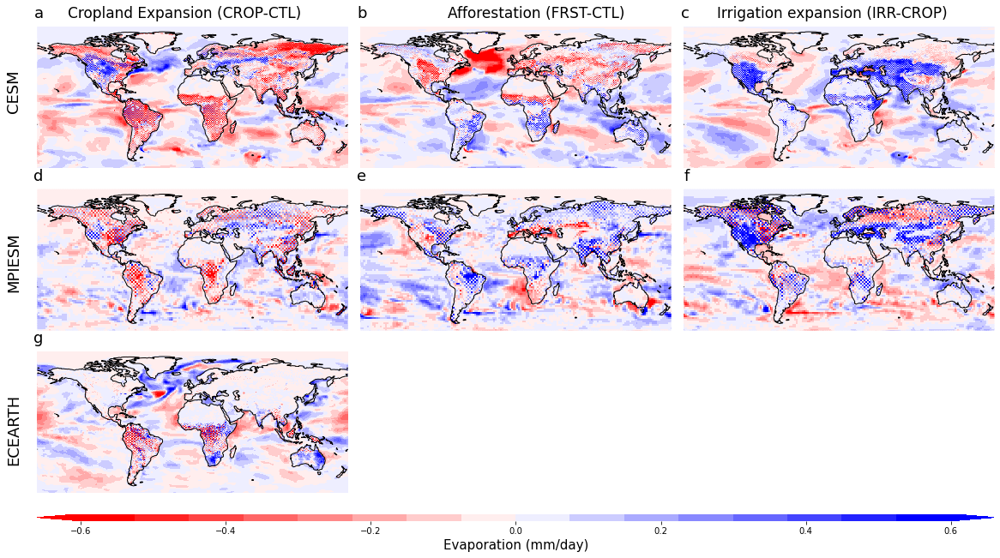

In [17]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='bwr_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[E_def_jja/365,E_for_jja/365,E_irr_jja/365]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[E_def_ec_jja/365]
        pan_list=['g','h']
    elif model=='mpiesm':
        da_list=[E_def_mpi_jja/365,E_for_mpi_jja/365,E_irr_mpi_jja/365]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-0.6, 0.6]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal',extend=extend)
cbar.set_label(label='Evaporation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



### plot winter evaporation (mm/day)

In [15]:
if np.max([np.max(E_def_djf/365),np.max(E_for_djf/365),np.max(E_irr_djf/365),np.max(E_def_mpi_djf/365),np.max(E_for_mpi_djf/365),np.max(E_irr_mpi_djf/365),np.max(E_def_ec_djf/365)]) > 0.6:
    extend='max'
    if np.min([np.min(E_def_djf/365),np.min(E_for_djf/365),np.min(E_irr_djf/365),np.min(E_def_mpi_djf/365),np.min(E_for_mpi_djf/365),np.min(E_irr_mpi_djf/365),np.min(E_def_ec_djf/365)]) < -0.6:
        extend='both'
elif np.min([np.min(E_def_djf/365),np.min(E_for_djf/365),np.min(E_irr_djf/365),np.min(E_def_mpi_djf/365),np.min(E_for_mpi_djf/365),np.min(E_irr_mpi_djf/365),np.min(E_def_ec_djf/365)]) < -0.6:
    extend='min'
else:
    extend='neither'
print(extend)

both


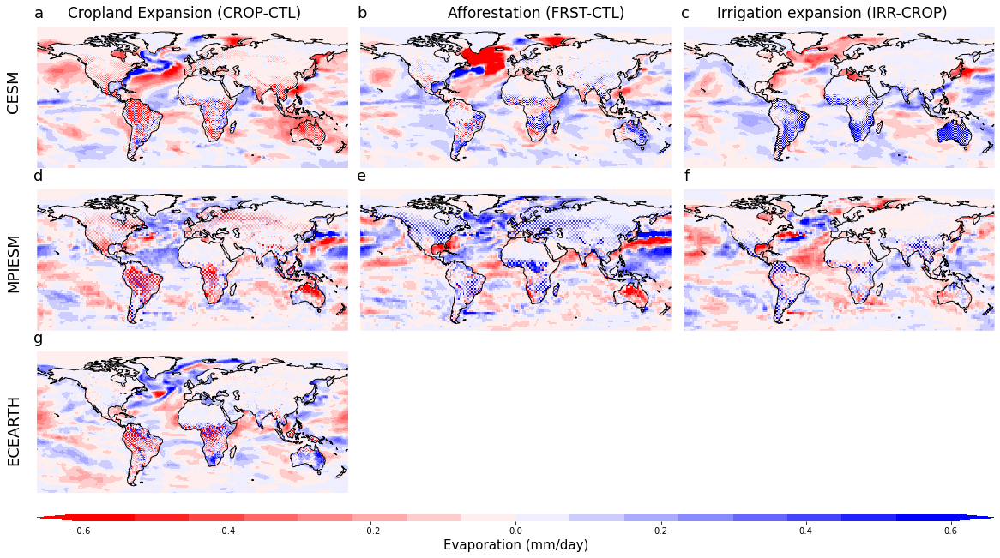

In [24]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='bwr_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[E_def_djf/365,E_for_djf/365,E_irr_djf/365]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[E_def_ec_djf/365]
        pan_list=['g','h']
    elif model=='mpiesm':
        da_list=[E_def_mpi_djf/365,E_for_mpi_djf/365,E_irr_mpi_djf/365]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-0.6, 0.6]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal',extend=extend)
cbar.set_label(label='Evaporation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



### plot mean precipitation (mm/day)

both


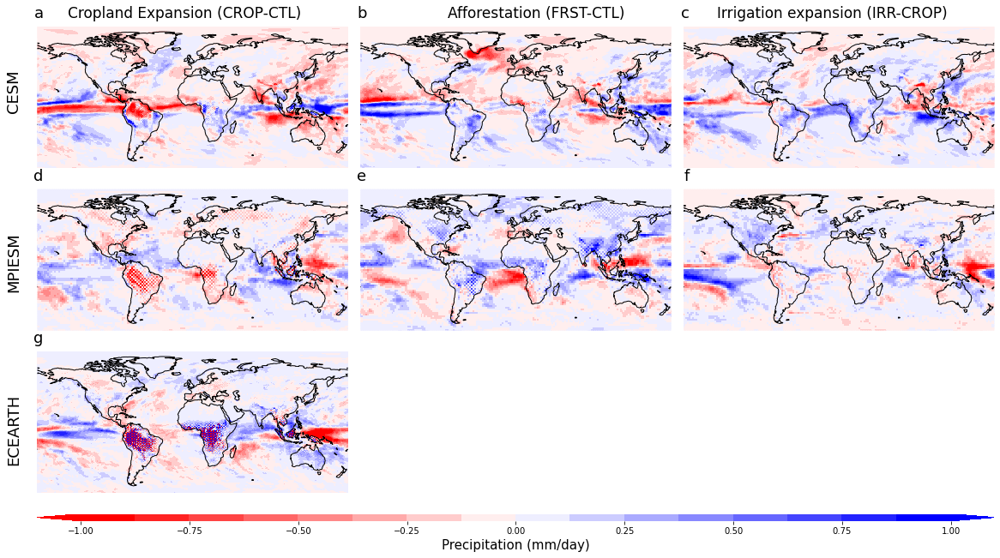

In [10]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
cmap='bwr_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[PT_def/365,PT_for/365,PT_irr/365]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[PT_def_ec/365]
        pan_list=['g']
    elif model =='mpiesm':
        da_list=[PT_def_mpi/365,PT_for_mpi/365,PT_irr_mpi/365]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-1, 1]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

if np.max([np.max(PT_def/365),np.max(PT_for/365),np.max(PT_irr/365),np.max(PT_def_mpi/365),np.max(PT_for_mpi/365),np.max(PT_irr_mpi/365),np.max(PT_def_ec/365)]) > 1:
    extend='max'
    if np.min([np.min(PT_def/365),np.min(PT_for/365),np.min(PT_irr/365),np.min(PT_def_mpi/365),np.min(PT_for_mpi/365),np.min(PT_irr_mpi/365),np.min(PT_def_ec/365)]) < -1:
        extend='both'
elif np.min([np.min(PT_def/365),np.min(PT_for/365),np.min(PT_irr/365),np.min(PT_def_mpi/365),np.min(PT_for_mpi/365),np.min(PT_irr_mpi/365),np.min(PT_def_ec/365)]) < -1:
    extend='min'
else:
    extend='neither'
print(extend)

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal',extend=extend)
cbar.set_label(label='Precipitation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



### plot summer precipitation (mm/day)


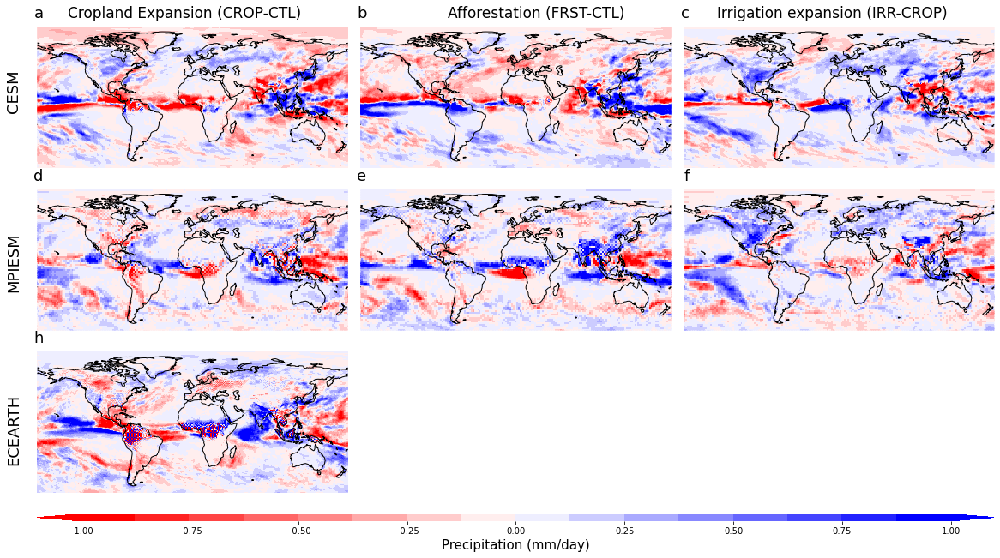

In [22]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='bwr_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[PT_def_jja/365,PT_for_jja/365,PT_irr_jja/365]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[PT_def_ec_jja/365]
        pan_list=['h','i']
    elif model =='mpiesm':
        da_list=[PT_def_mpi_jja/365,PT_for_mpi_jja/365,PT_irr_mpi_jja/365]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-1, 1]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
if np.max([np.max(PT_def_jja/365),np.max(PT_for_jja/365),np.max(PT_irr_jja/365),np.max(PT_def_mpi_jja/365),np.max(PT_for_mpi_jja/365),np.max(PT_irr_mpi_jja/365),np.max(PT_def_ec_jja/365)]) > 1:
    extend='max'
    if np.min([np.min(PT_def_jja/365),np.min(PT_for_jja/365),np.min(PT_irr_jja/365),np.min(PT_def_mpi_jja/365),np.min(PT_for_mpi_jja/365),np.min(PT_irr_mpi_jja/365),np.min(PT_def_ec_jja/365)]) < -1:
        extend='both'
elif np.min([np.min(PT_def_jja/365),np.min(PT_for_jja/365),np.min(PT_irr_jja/365),np.min(PT_def_mpi_jja/365),np.min(PT_for_mpi_jja/365),np.min(PT_irr_mpi_jja/365),np.min(PT_def_ec_jja/365)]) < -1:
    extend='min'
else:
    extend='neither'
cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal',extend=extend)
cbar.set_label(label='Precipitation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



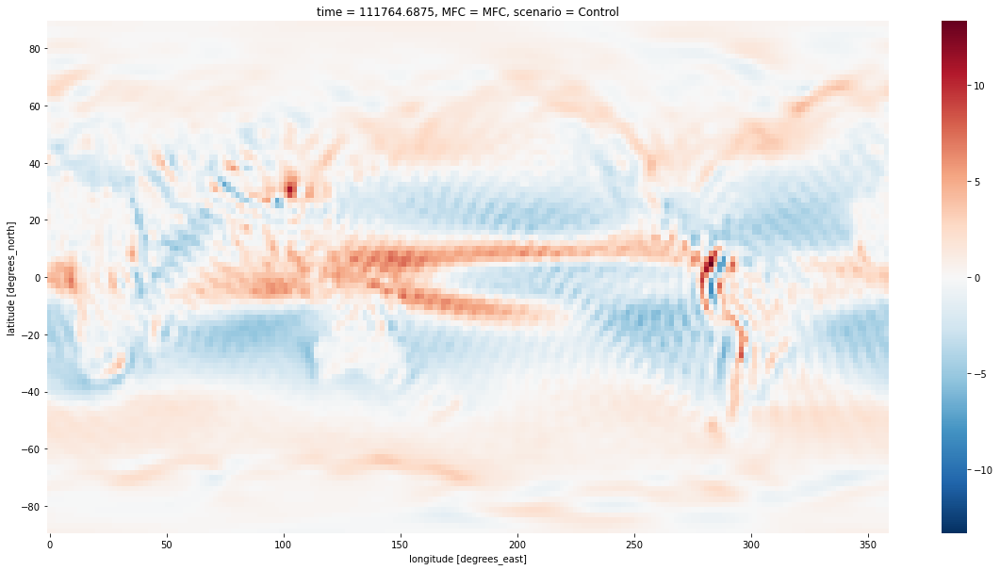

In [18]:
jos=MFC_ec[2]-MFC_ec[0]
MFC_mpi[0].plot()

### plot winter precipitation (mm/day)


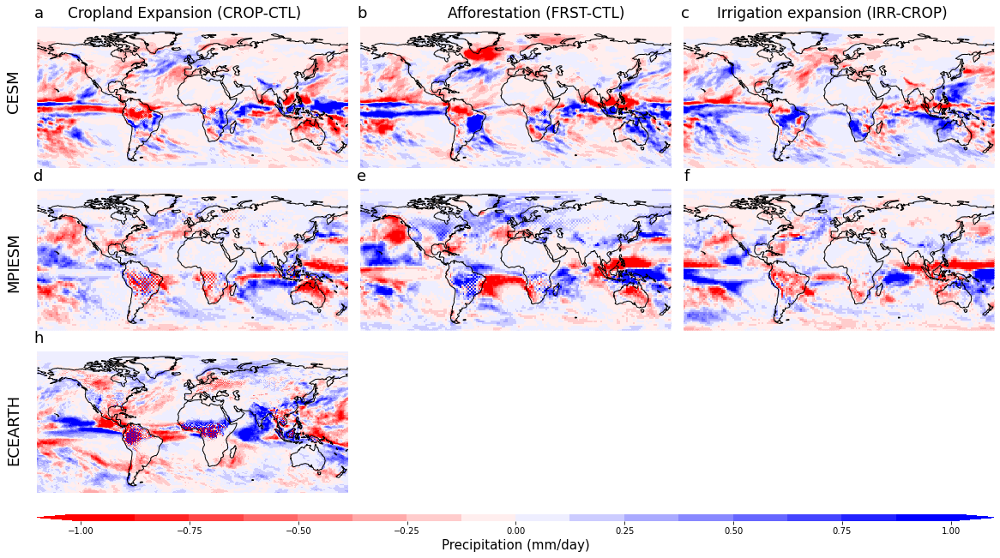

In [23]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='bwr_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[PT_def_djf/365,PT_for_djf/365,PT_irr_djf/365]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[PT_def_ec_djf/365]
        pan_list=['h','i']
    elif model =='mpiesm':
        da_list=[PT_def_mpi_djf/365,PT_for_mpi_djf/365,PT_irr_mpi_djf/365]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-1, 1]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
if np.max([np.max(PT_def_djf/365),np.max(PT_for_djf/365),np.max(PT_irr_djf/365),np.max(PT_def_mpi_djf/365),np.max(PT_for_mpi_djf/365),np.max(PT_irr_mpi_djf/365),np.max(PT_def_ec_djf/365)]) > 1:
    extend='max'
    if np.min([np.min(PT_def_djf/365),np.min(PT_for_djf/365),np.min(PT_irr_djf/365),np.min(PT_def_mpi_djf/365),np.min(PT_for_mpi_djf/365),np.min(PT_irr_mpi_djf/365),np.min(PT_def_ec_djf/365)]) < -1:        extend='both'
elif np.min([np.min(PT_def_djf/365),np.min(PT_for_djf/365),np.min(PT_irr_djf/365),np.min(PT_def_mpi_djf/365),np.min(PT_for_mpi_djf/365),np.min(PT_irr_mpi_djf/365),np.min(PT_def_ec_djf/365)]) < -1:
    extend='min'
else:
    extend='neither'
cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal',extend=extend)
cbar.set_label(label='Precipitation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



### plot mean MFC (mm/day)

both


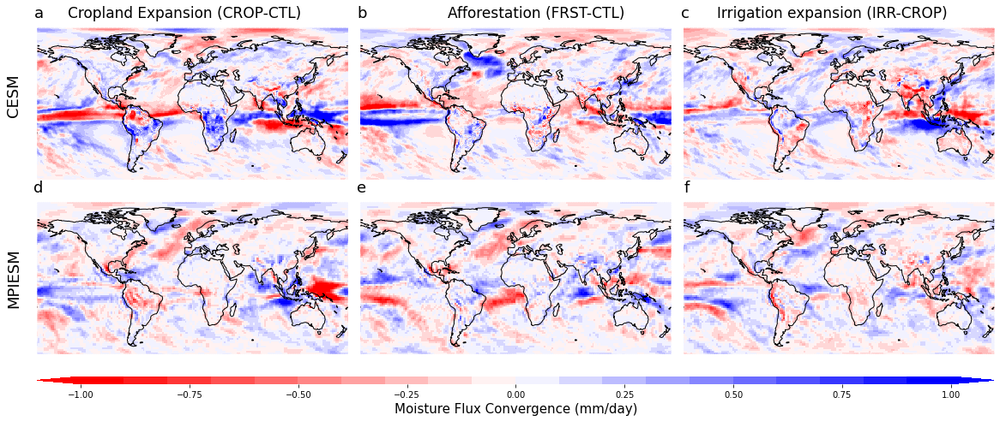

In [23]:
plt.rcParams['figure.figsize'] = [20, 7]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(2,3)
cmap='bwr_r'
for model in ['cesm','mpiesm']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[MFC_def,MFC_for,MFC_irr]
        pan_list=['a','b','c']
    elif model =='mpiesm':
        da_list=[MFC_def_mpi,MFC_for_mpi,MFC_irr_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-1, 1]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 20), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

            
if np.max([np.max(MFC_def),np.max(MFC_for),np.max(MFC_irr),np.max(MFC_def_mpi),np.max(MFC_for_mpi),np.max(MFC_irr_mpi)]) > 1:
    extend='max'
    if np.min([np.min(MFC_def),np.min(MFC_for),np.min(MFC_irr),np.min(MFC_def_mpi),np.min(MFC_for_mpi),np.min(MFC_irr_mpi)]) < -1:
        extend='both'
elif np.min([np.min(MFC_def),np.min(MFC_for),np.min(MFC_irr),np.min(MFC_def_mpi),np.min(MFC_for_mpi),np.min(MFC_irr_mpi)]) < -1:
    extend='min'
else:
    extend='neither'
print(extend)
cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal',extend=extend)
cbar.set_label(label='Moisture Flux Convergence ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


both


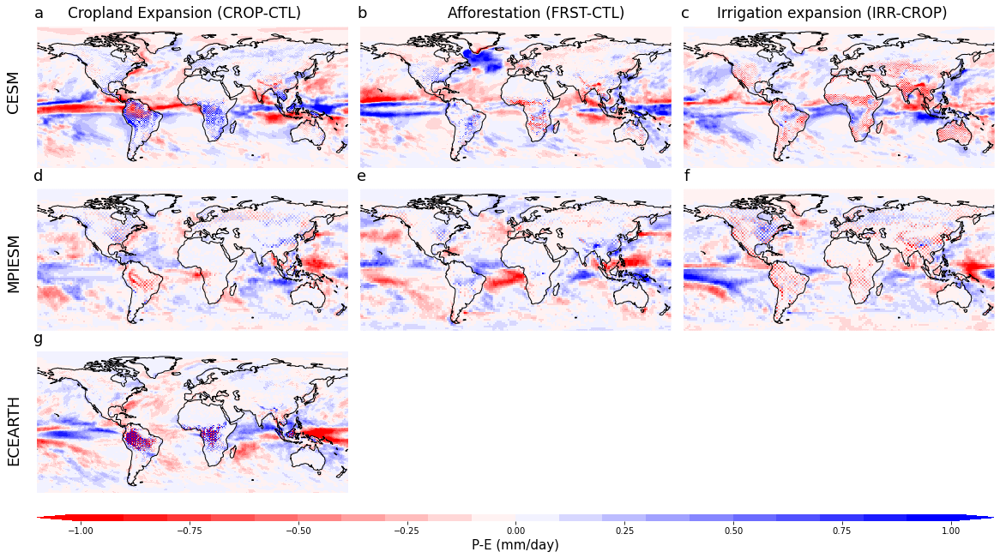

In [11]:
plt.rcParams['figure.figsize'] = [20, 10]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='bwr_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[(PT_def-E_def)/365,(PT_for-E_for)/365,(PT_irr-E_irr)/365]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[(PT_def_ec-E_def_ec)/365]
        pan_list=['g']
    elif model =='mpiesm':
        da_list=[(PT_def_mpi-E_def_mpi)/365,(PT_for_mpi-E_for_mpi)/365,(PT_irr_mpi-E_irr_mpi)/365]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-1, 1]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 20), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

if np.max([np.max((PT_def-E_def)/365),np.max((PT_for-E_for)/365),np.max((PT_irr-E_irr)/365),np.max((PT_def_ec-E_def_ec)/365),np.max((PT_def_mpi-E_def_mpi)/365),np.max((PT_for_mpi-E_for_mpi)/365),np.max((PT_irr_mpi-E_irr_mpi)/365)]) > 1:
    extend='max'
    if np.min([np.min((PT_def-E_def)/365),np.min((PT_for-E_for)/365),np.min((PT_irr-E_irr)/365),np.min((PT_def_ec-E_def_ec)/365),np.min((PT_def_mpi-E_def_mpi)/365),np.min((PT_for_mpi-E_for_mpi)/365),np.min((PT_irr_mpi-E_irr_mpi)/365)]) < -1:
        extend='both'
elif np.min([np.min((PT_def-E_def)/365),np.min((PT_for-E_for)/365),np.min((PT_irr-E_irr)/365),np.min((PT_def_ec-E_def_ec)/365),np.min((PT_def_mpi-E_def_mpi)/365),np.min((PT_for_mpi-E_for_mpi)/365),np.min((PT_irr_mpi-E_irr_mpi)/365)]) < -1:
    extend='min'
else:
    extend='neither'
print(extend)
cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal',extend=extend)
cbar.set_label(label='P-E ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


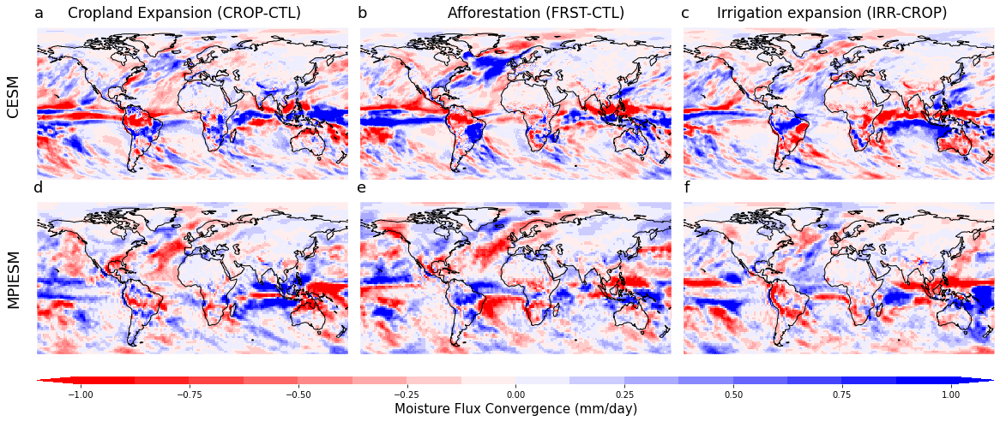

In [36]:
plt.rcParams['figure.figsize'] = [20, 7]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(2,3)
cmap='bwr_r'
for model in ['cesm','mpiesm']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[MFC_def_djf,MFC_for_djf,MFC_irr_djf]
        pan_list=['a','b','c']
    elif model =='mpiesm':
        da_list=[MFC_def_mpi_djf,MFC_for_mpi_djf,MFC_irr_mpi_djf]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-1, 1]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

if np.max([np.max(MFC_def_djf),np.max(MFC_for_djf),np.max(MFC_irr_djf),np.max(MFC_def_mpi_djf),np.max(MFC_for_mpi_djf),np.max(MFC_irr_mpi_djf)]) > 1:
    extend='max'
    if np.min([np.min(MFC_def_djf),np.min(MFC_for_djf),np.min(MFC_irr_djf),np.min(MFC_def_mpi_djf),np.min(MFC_for_mpi_djf),np.min(MFC_irr_mpi_djf)]) < -1:
        extend='both'
elif np.min([np.min(MFC_def_djf),np.min(MFC_for_djf),np.min(MFC_irr_djf),np.min(MFC_def_mpi_djf),np.min(MFC_for_mpi_djf),np.min(MFC_irr_mpi_djf)]) < -1:
    extend='min'
else:
    extend='neither'
cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal',extend=extend)
cbar.set_label(label='Moisture Flux Convergence ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


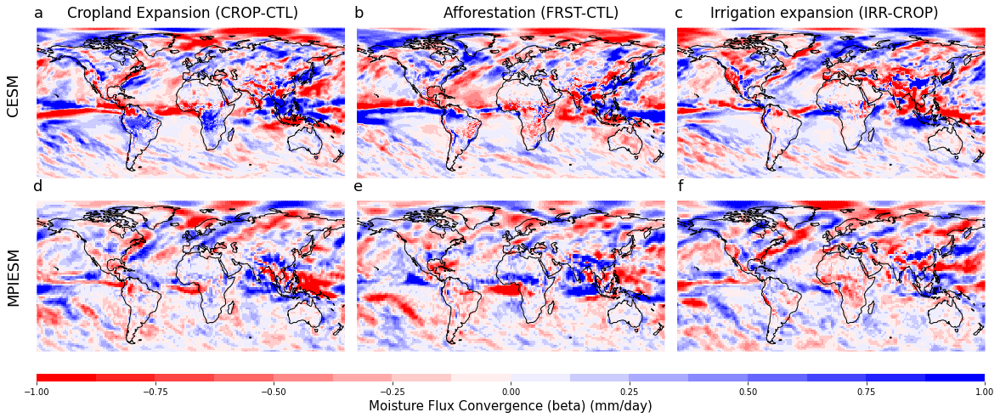

In [37]:
plt.rcParams['figure.figsize'] = [20, 7]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(2,3)
cmap='bwr_r'
for model in ['cesm','mpiesm']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[MFC_def_jja,MFC_for_jja,MFC_irr_jja]
        pan_list=['a','b','c']
    elif model =='mpiesm':
        da_list=[MFC_def_mpi_jja,MFC_for_mpi_jja,MFC_irr_mpi_jja]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-1, 1]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
if np.max([np.max(MFC_def_jja),np.max(MFC_for_jja),np.max(MFC_irr_jja),np.max(MFC_def_mpi_jja),np.max(MFC_for_mpi_jja),np.max(MFC_irr_mpi_jja)]) > 1:
    extend='max'
    if np.min([np.min(MFC_def_jja),np.min(MFC_for_jja),np.min(MFC_irr_jja),np.min(MFC_def_mpi_jja),np.min(MFC_for_mpi_jja),np.min(MFC_irr_mpi_jja)]) < -1:
        extend='both'
elif np.min([np.min(MFC_def_jja),np.min(MFC_for_jja),np.min(MFC_irr_jja),np.min(MFC_def_mpi_jja),np.min(MFC_for_mpi_jja),np.min(MFC_irr_mpi_jja)]) < -1:
    extend='min'
else:
    extend='neither'
cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='Moisture Flux Convergence ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


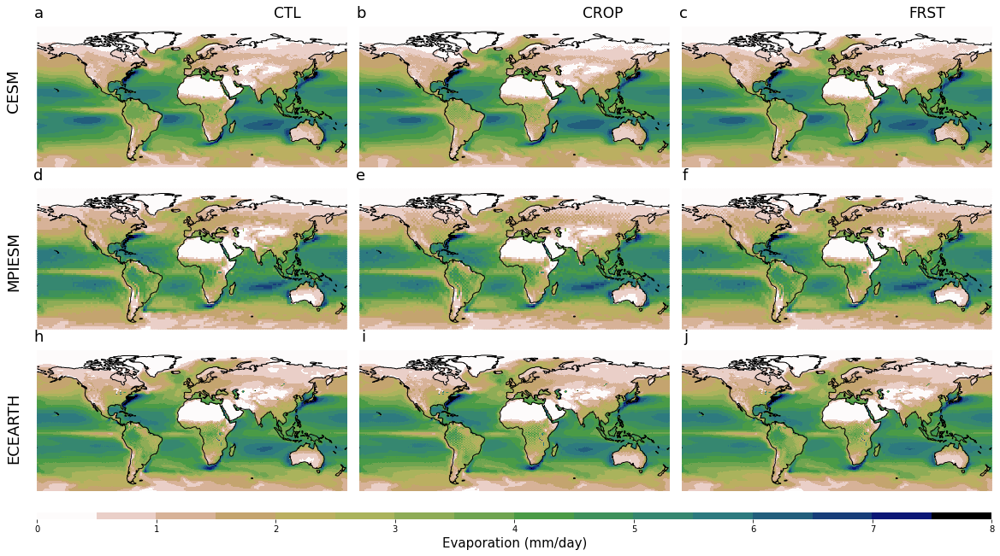

In [24]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='gist_earth_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[E[0],E[1],E[2]]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[E_ec[0],E_ec[1],E_ec[2]]
        pan_list=['h','i','j']
    elif model =='mpiesm':
        da_list=[E_mpi[0],E_mpi[1],E_mpi[2]]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP'
        elif i==2:
            change='FRST'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [0,8]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='Evaporation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


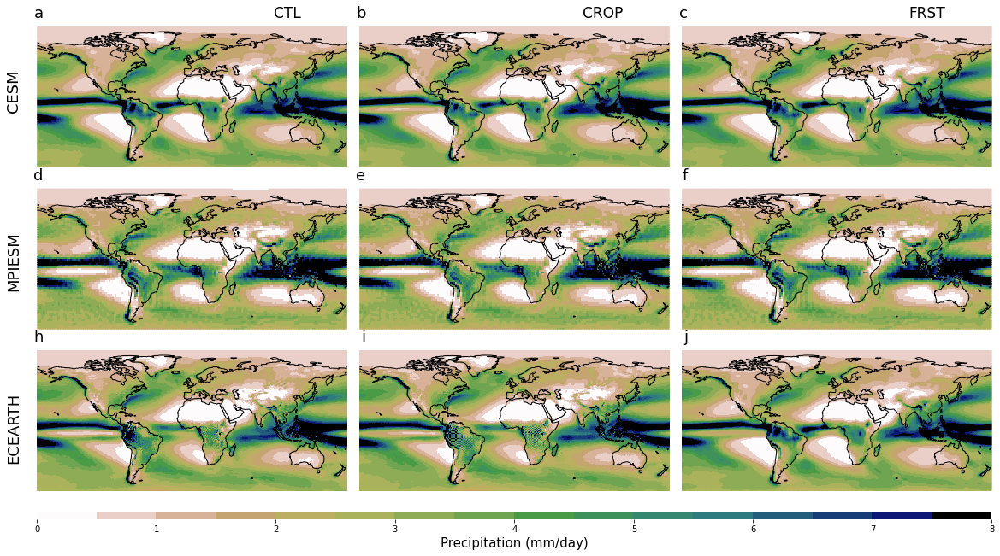

In [25]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='gist_earth_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[PRECT[0],PRECT[1],PRECT[2]]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[PRECT_ec[0],PRECT_ec[1],PRECT[2]]
        pan_list=['h','i','j']
    elif model =='mpiesm':
        da_list=[PRECT_mpi[0],PRECT_mpi[1],PRECT_mpi[2]]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP'
        elif i==2:
            change='FRST'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [0,8]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='Precipitation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


In [26]:
#Percentage of change of precipitation respect to comparison scenario 
E_full = (E[2] - E[1])*365 #Deforestation 

E_full_ec = (E_ec[2] - E_ec[1])*365 #Deforestation 

E_full_mpi = (E_mpi[2] - E_mpi[1])*365#Deforestation 

PT_full = (PRECT[2] - PRECT[1])*365 #Deforestation 

PT_full_ec = (PRECT_ec[2] - PRECT_ec[1])*365 #Deforestation 

PT_full_mpi = (PRECT_mpi[2] - PRECT_mpi[1])*365#Deforestation 



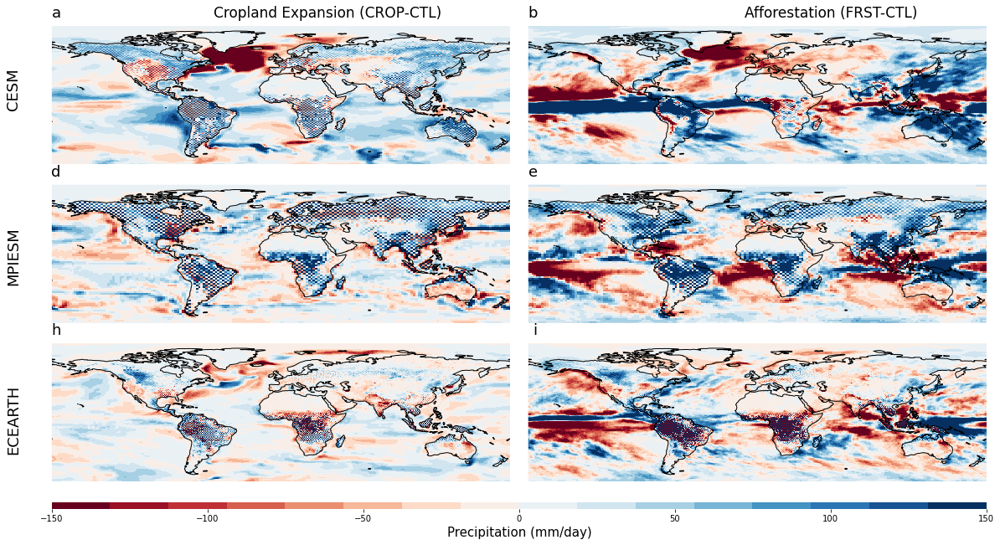

In [27]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,2,width_ratios=[3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[E_full,PT_full]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[E_full_ec,PT_full_ec]
        pan_list=['h','i','j']
    elif model =='mpiesm':
        da_list=[E_full_mpi,PT_full_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-150, 150]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='Precipitation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)

